In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Lasso,Ridge,RidgeCV,ElasticNet,ElasticNetCV,LinearRegression,LassoCV
from sklearn.model_selection import train_test_split
import statsmodels.api as sm
import matplotlib.pyplot as plt
import seaborn as sns
from pandas_profiling import ProfileReport
from statsmodels.stats.outliers_influence import variance_inflation_factor
import pickle

In [3]:
raw = pd.read_csv("E:/2.ML-DATASETS/fitbit.csv")

In [4]:
raw

,Id,ActivityDate,TotalSteps,TotalDistance,TrackerDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,SedentaryMinutes,Calories
0,1503960366,3/25/2016,11004,7.110000,7.110000,0.0,2.57,0.46,4.07,0.00,33,12,205,804,1819
1,1503960366,3/26/2016,17609,11.550000,11.550000,0.0,6.92,0.73,3.91,0.00,89,17,274,588,2154
2,1503960366,3/27/2016,12736,8.530000,8.530000,0.0,4.66,0.16,3.71,0.00,56,5,268,605,1944
3,1503960366,3/28/2016,13231,8.930000,8.930000,0.0,3.19,0.79,4.95,0.00,39,20,224,1080,1932
4,1503960366,3/29/2016,12041,7.850000,7.850000,0.0,2.16,1.09,4.61,0.00,28,28,243,763,1886
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
452,8877689391,4/8/2016,23014,20.389999,20.389999,0.0,11.10,0.63,8.62,0.00,70,29,359,982,4196
453,8877689391,4/9/2016,16470,8.070000,8.070000,0.0,0.00,0.02,8.02,0.00,90,9,289,1052,3841
454,8877689391,4/10/2016,28497,27.530001,27.530001,0.0,21.92,1.12,4.46,0.00,128,46,211,1055,4526
455,8877689391,4/11/2016,10622,8.060000,8.060000,0.0,1.47,0.15,6.37,0.01,18,7,225,1190,2820


<AxesSubplot:>

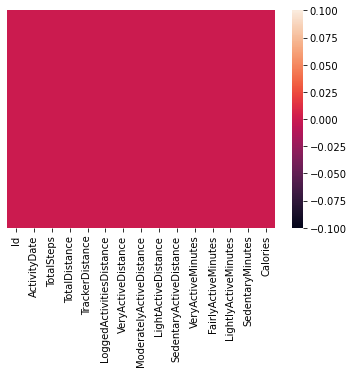

In [6]:
sns.heatmap(raw.isnull(),yticklabels=False)

In [7]:
data = raw.drop(columns = ["Id","ActivityDate"])

In [8]:
data

,TotalSteps,TotalDistance,TrackerDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,SedentaryMinutes,Calories
0,11004,7.110000,7.110000,0.0,2.57,0.46,4.07,0.00,33,12,205,804,1819
1,17609,11.550000,11.550000,0.0,6.92,0.73,3.91,0.00,89,17,274,588,2154
2,12736,8.530000,8.530000,0.0,4.66,0.16,3.71,0.00,56,5,268,605,1944
3,13231,8.930000,8.930000,0.0,3.19,0.79,4.95,0.00,39,20,224,1080,1932
4,12041,7.850000,7.850000,0.0,2.16,1.09,4.61,0.00,28,28,243,763,1886
...,...,...,...,...,...,...,...,...,...,...,...,...,...
452,23014,20.389999,20.389999,0.0,11.10,0.63,8.62,0.00,70,29,359,982,4196
453,16470,8.070000,8.070000,0.0,0.00,0.02,8.02,0.00,90,9,289,1052,3841
454,28497,27.530001,27.530001,0.0,21.92,1.12,4.46,0.00,128,46,211,1055,4526
455,10622,8.060000,8.060000,0.0,1.47,0.15,6.37,0.01,18,7,225,1190,2820


In [15]:
data["TotalSteps"].quantile(0)

0.0

In [14]:
data.describe()

,TotalSteps,TotalDistance,TrackerDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,SedentaryMinutes,Calories
count,457.000000,457.000000,457.000000,457.000000,457.000000,457.000000,457.000000,457.000000,457.000000,457.000000,457.000000,457.000000,457.000000
mean,6546.562363,4.663523,4.609847,0.179427,1.180897,0.478643,2.890197,0.001904,16.623632,13.070022,170.070022,995.282276,2189.452954
std,5398.493064,4.082072,4.068540,0.849232,2.487159,0.830995,2.237523,0.008487,28.919704,36.208635,122.205372,337.021404,815.484523
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,32.000000,0.000000
25%,1988.000000,1.410000,1.280000,0.000000,0.000000,0.000000,0.870000,0.000000,0.000000,0.000000,64.000000,728.000000,1776.000000
50%,5986.000000,4.090000,4.090000,0.000000,0.000000,0.020000,2.930000,0.000000,0.000000,1.000000,181.000000,1057.000000,2062.000000
75%,10198.000000,7.160000,7.110000,0.000000,1.310000,0.670000,4.460000,0.000000,25.000000,16.000000,257.000000,1285.000000,2667.000000
max,28497.000000,27.530001,27.530001,6.727057,21.920000,6.400000,12.510000,0.100000,202.000000,660.000000,720.000000,1440.000000,4562.000000


<AxesSubplot:>

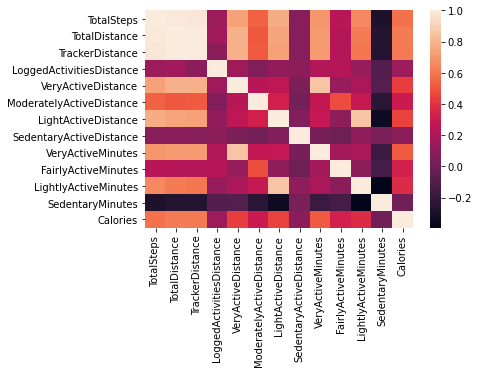

In [21]:
sns.heatmap(data.corr())

In [22]:
pf = ProfileReport(data)

In [23]:
pf

Summarize dataset:   0%|          | 0/26 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [33]:
scaler = StandardScaler()
scaled_arr = scaler.fit_transform(data)

In [44]:
vif_df_scaled_arr = pd.DataFrame()
vif_df_scaled_arr["vif"] = [variance_inflation_factor(scaled_arr,i) for i in range(scaled_arr.shape[1])]
vif_df_scaled_arr["column"] = data.columns
vif_df_scaled_arr

,vif,column
0,96.958566,TotalSteps
1,426.808089,TotalDistance
2,237.940253,TrackerDistance
3,2.604749,LoggedActivitiesDistance
4,30.338567,VeryActiveDistance
5,3.314359,ModeratelyActiveDistance
6,16.026063,LightActiveDistance
7,1.047906,SedentaryActiveDistance
8,8.169437,VeryActiveMinutes
9,1.750750,FairlyActiveMinutes


In [51]:
scaled_arr_pd = pd.DataFrame(scaled_arr,columns = data.columns)

In [53]:
scaled_arr_pd

,TotalSteps,TotalDistance,TrackerDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,SedentaryMinutes,Calories
0,0.826587,0.599979,0.615182,-0.211514,0.559122,-0.022460,0.527859,-0.224561,0.566891,-0.029584,0.286143,-0.568189,-0.454771
1,2.051417,1.688854,1.707679,-0.211514,2.310023,0.302808,0.456273,-0.224561,2.505409,0.108656,0.851385,-1.209800,-0.043522
2,1.147769,0.948223,0.964584,-0.211514,1.400359,-0.383868,0.366790,-0.224561,1.363068,-0.223120,0.802234,-1.159303,-0.301320
3,1.239561,1.046320,1.063007,-0.211514,0.808676,0.375090,0.921582,-0.224561,0.774589,0.191600,0.441790,0.251647,-0.316051
4,1.018888,0.781458,0.797265,-0.211514,0.394095,0.736498,0.769461,-0.224561,0.393809,0.412784,0.597436,-0.689976,-0.372521
...,...,...,...,...,...,...,...,...,...,...,...,...,...
452,3.053720,3.856794,3.882829,-0.211514,3.992497,0.182339,2.563585,-0.224561,1.847697,0.440432,1.547698,-0.039454,2.463255
453,1.840201,0.835411,0.851398,-0.211514,-0.475318,-0.552525,2.295138,-0.224561,2.540025,-0.112528,0.974264,0.168476,2.027454
454,4.070486,5.607823,5.639682,-0.211514,8.347610,0.772639,0.702350,-0.224561,3.855448,0.910448,0.335295,0.177387,2.868365
455,0.755749,0.832959,0.848937,-0.211514,0.116366,-0.395915,1.556907,0.955030,0.047645,-0.167824,0.449982,0.578394,0.774065


In [54]:
scaled_arr_pd.describe()

,TotalSteps,TotalDistance,TrackerDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,SedentaryMinutes,Calories
count,4.570000e+02,4.570000e+02,4.570000e+02,4.570000e+02,4.570000e+02,4.570000e+02,4.570000e+02,4.570000e+02,4.570000e+02,4.570000e+02,4.570000e+02,4.570000e+02,4.570000e+02
mean,-1.503781e-16,-5.174562e-17,-3.422985e-16,5.285099e-16,-1.540222e-16,1.579092e-17,-4.069198e-17,-1.163062e-16,9.418675e-16,-1.259629e-16,3.158184e-17,-7.336704e-17,2.487677e-16
std,1.001096e+00,1.001096e+00,1.001096e+00,1.001096e+00,1.001096e+00,1.001096e+00,1.001096e+00,1.001096e+00,1.001096e+00,1.001096e+00,1.001096e+00,1.001096e+00,1.001096e+00
min,-1.213994e+00,-1.143692e+00,-1.134289e+00,-2.115135e-01,-4.753180e-01,-5.766193e-01,-1.293110e+00,-2.245612e-01,-5.754502e-01,-3.613598e-01,-1.393199e+00,-2.861355e+00,-2.687791e+00
25%,-8.453392e-01,-7.979007e-01,-8.193347e-01,-2.115135e-01,-4.753180e-01,-5.766193e-01,-9.038613e-01,-2.245612e-01,-5.754502e-01,-3.613598e-01,-8.689165e-01,-7.939412e-01,-5.075584e-01
50%,-1.039506e-01,-1.406519e-01,-1.279123e-01,-2.115135e-01,-4.753180e-01,-5.525254e-01,1.780842e-02,-2.245612e-01,-5.754502e-01,-3.337118e-01,8.953744e-02,1.833277e-01,-1.564624e-01
75%,6.771221e-01,6.122412e-01,6.151822e-01,-2.115135e-01,5.196463e-02,2.305265e-01,7.023495e-01,-2.245612e-01,2.899597e-01,8.100800e-02,7.121229e-01,8.605840e-01,5.862409e-01
max,4.070486e+00,5.607823e+00,5.639682e+00,7.718511e+00,8.347610e+00,7.133430e+00,4.304020e+00,1.157135e+01,6.417062e+00,1.788631e+01,4.504979e+00,1.320999e+00,2.912559e+00


In [55]:
data_np =data.to_numpy()

In [60]:
data_np_vif = pd.DataFrame()
data_np_vif['vif'] = [ variance_inflation_factor(data_np,i) for i in range(data.shape[1])]
data_np_vif['col'] = data.columns

In [61]:
data_np_vif

,vif,col
0,230.143190,TotalSteps
1,939.833841,TotalDistance
2,540.553095,TrackerDistance
3,2.692533,LoggedActivitiesDistance
4,36.203839,VeryActiveDistance
5,4.290203,ModeratelyActiveDistance
6,42.288882,LightActiveDistance
7,1.093531,SedentaryActiveDistance
8,10.771700,VeryActiveMinutes
9,1.960058,FairlyActiveMinutes


In [111]:
x = data.drop(columns = ["TotalDistance","TrackerDistance","TotalSteps","Calories"])

In [112]:
y = data["Calories"]

In [113]:
scaler = StandardScaler()
x_scaler = scaler.fit_transform(x)

In [114]:
x_vif = pd.DataFrame()
x_vif["vif"] = [variance_inflation_factor(x_scaler,i) for i in range(x.shape[1])]
x_vif["column"] = x.columns

In [115]:
x_vif

,vif,column
0,1.134991,LoggedActivitiesDistance
1,3.820409,VeryActiveDistance
2,1.514986,ModeratelyActiveDistance
3,4.026927,LightActiveDistance
4,1.031901,SedentaryActiveDistance
5,4.014387,VeryActiveMinutes
6,1.389040,FairlyActiveMinutes
7,4.068221,LightlyActiveMinutes
8,1.257975,SedentaryMinutes


In [116]:
x.describe()

,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,SedentaryMinutes
count,457.000000,457.000000,457.000000,457.000000,457.000000,457.000000,457.000000,457.000000,457.000000
mean,0.179427,1.180897,0.478643,2.890197,0.001904,16.623632,13.070022,170.070022,995.282276
std,0.849232,2.487159,0.830995,2.237523,0.008487,28.919704,36.208635,122.205372,337.021404
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,32.000000
25%,0.000000,0.000000,0.000000,0.870000,0.000000,0.000000,0.000000,64.000000,728.000000
50%,0.000000,0.000000,0.020000,2.930000,0.000000,0.000000,1.000000,181.000000,1057.000000
75%,0.000000,1.310000,0.670000,4.460000,0.000000,25.000000,16.000000,257.000000,1285.000000
max,6.727057,21.920000,6.400000,12.510000,0.100000,202.000000,660.000000,720.000000,1440.000000


In [117]:
x_train,x_test,y_train,y_test = train_test_split(x_scaler,y,test_size = 0.25,random_state = 100)

In [118]:
lr = LinearRegression()
lr.fit(x_train,y_train)

LinearRegression()

In [119]:
x

,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,SedentaryMinutes
0,0.0,2.57,0.46,4.07,0.00,33,12,205,804
1,0.0,6.92,0.73,3.91,0.00,89,17,274,588
2,0.0,4.66,0.16,3.71,0.00,56,5,268,605
3,0.0,3.19,0.79,4.95,0.00,39,20,224,1080
4,0.0,2.16,1.09,4.61,0.00,28,28,243,763
...,...,...,...,...,...,...,...,...,...
452,0.0,11.10,0.63,8.62,0.00,70,29,359,982
453,0.0,0.00,0.02,8.02,0.00,90,9,289,1052
454,0.0,21.92,1.12,4.46,0.00,128,46,211,1055
455,0.0,1.47,0.15,6.37,0.01,18,7,225,1190


In [121]:
test = scaler.transform([[0.0,2.57,0.46,4.07,0.00,33,12,205,804]])

In [122]:
lr.predict(test)

array([2385.99309761])

In [123]:
data

,TotalSteps,TotalDistance,TrackerDistance,LoggedActivitiesDistance,VeryActiveDistance,ModeratelyActiveDistance,LightActiveDistance,SedentaryActiveDistance,VeryActiveMinutes,FairlyActiveMinutes,LightlyActiveMinutes,SedentaryMinutes,Calories
0,11004,7.110000,7.110000,0.0,2.57,0.46,4.07,0.00,33,12,205,804,1819
1,17609,11.550000,11.550000,0.0,6.92,0.73,3.91,0.00,89,17,274,588,2154
2,12736,8.530000,8.530000,0.0,4.66,0.16,3.71,0.00,56,5,268,605,1944
3,13231,8.930000,8.930000,0.0,3.19,0.79,4.95,0.00,39,20,224,1080,1932
4,12041,7.850000,7.850000,0.0,2.16,1.09,4.61,0.00,28,28,243,763,1886
...,...,...,...,...,...,...,...,...,...,...,...,...,...
452,23014,20.389999,20.389999,0.0,11.10,0.63,8.62,0.00,70,29,359,982,4196
453,16470,8.070000,8.070000,0.0,0.00,0.02,8.02,0.00,90,9,289,1052,3841
454,28497,27.530001,27.530001,0.0,21.92,1.12,4.46,0.00,128,46,211,1055,4526
455,10622,8.060000,8.060000,0.0,1.47,0.15,6.37,0.01,18,7,225,1190,2820


In [124]:
lr.score(x_test,y_test)

0.5359176768761875

In [109]:
def adj_r2(x,y):
    r2 = lr.score(x,y)
    n = x.shape[1]
    p = x.shape[0]
    adjusted_r2 = 1-(1-r2)*(n-1)/(p-1)
    return adjusted_r2

In [110]:
adj_r2(x_test,y_test)

0.9637895605207625